# Data Preprocessing

In [56]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [57]:
data = pd.read_excel(R'D:\Concordia\Systems Analytics\Assignment 2\Case_2_Dataset.xlsx')

In [58]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   DFactor1         13611 non-null  float64
 4   DFactor2         13611 non-null  float64
 5   DFactor3         13611 non-null  float64
 6   DFactor4         13611 non-null  int64  
 7   DFactor5         13611 non-null  float64
 8   DFactor6         13611 non-null  float64
 9   DFactor7         13611 non-null  float64
 10  DFactor8         13611 non-null  float64
 11  DFactor9         13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [59]:
data = data.drop_duplicates()

In [60]:
data.shape

(13543, 17)

In [61]:
data.nunique()

Area               12011
Perimeter          13416
MajorAxisLength    13543
DFactor1           13543
DFactor2           13543
DFactor3           13543
DFactor4           12066
DFactor5           12011
DFactor6           13535
DFactor7           13526
DFactor8           13543
DFactor9           13543
ShapeFactor1       13543
ShapeFactor2       13543
ShapeFactor3       13543
ShapeFactor4       13543
Class                  7
dtype: int64

#### The above information shows that the target variable has seven categories of data.

###### Now, Calculate the Z-score for each data point, which represents how many standard deviations a data point is from the mean. Typically, a Z-score above a certain threshold (e.g., 3 or -3) is considered an outlier.

In [62]:
from scipy import stats
import numpy as np

numeric_data = data.iloc[:, :-1]  # Exclude the last column

# Calculate z-scores
z_scores = stats.zscore(numeric_data)
abs_z_scores = np.abs(z_scores)

# Identify outliers
outliers = (abs_z_scores > 3).all(axis=1)

# Filter the DataFrame, excluding rows with outliers
data = data[~outliers]


In [63]:
data.shape

(13543, 17)

###### Applying log transformations to the data to reduce the impact of extreme values.

In [64]:
# Specify the columns to be log-transformed
columns_to_transform = ['Area', 'Perimeter','MajorAxisLength','DFactor1','DFactor4','DFactor5']

# Apply log transformation to selected columns
data[columns_to_transform] = np.log1p(data[columns_to_transform])

# Display the transformed DataFrame
print(data)


            Area  Perimeter  MajorAxisLength  DFactor1  DFactor2  DFactor3  \
0      10.254004   6.415573         5.343186  5.164150  1.197191  0.549812   
1      10.265871   6.459933         5.305912  5.213491  1.097356  0.411785   
2      10.288103   6.437928         5.365163  5.175761  1.209713  0.562727   
3      10.309253   6.472167         5.354499  5.212305  1.153638  0.498616   
4      10.313642   6.431547         5.312456  5.253735  1.060798  0.333680   
...          ...        ...              ...       ...       ...       ...   
13606  10.647756   6.634234         5.668921  5.230813  1.552728  0.765002   
13607  10.647851   6.631341         5.643949  5.256000  1.476439  0.735702   
13608  10.648753   6.633741         5.643820  5.258474  1.472582  0.734065   
13609  10.648943   6.639587         5.650321  5.253716  1.489326  0.741055   
13610  10.649227   6.650586         5.690842  5.210604  1.619841  0.786693   

        DFactor4  DFactor5  DFactor6  DFactor7  DFactor8  DFact

##### IQR outlier removal method:

In [65]:
# Specify the columns for IQR outlier removal
columns_to_check = ['DFactor1','DFactor2','DFactor3','DFactor4','DFactor5','DFactor6','DFactor7','DFactor8','DFactor9','ShapeFactor1','ShapeFactor2','ShapeFactor3','ShapeFactor4']

# Calculate Q1 and Q3 for the specified columns
Q1 = data[columns_to_check].quantile(0.25)
Q3 = data[columns_to_check].quantile(0.75)

# Calculate IQR for the specified columns
IQR = Q3 - Q1

# Identify outliers
outliers = ((data[columns_to_check] < (Q1 - 2 * IQR)) | (data[columns_to_check] > (Q3 + 2 * IQR)))

# Filter the DataFrame, excluding rows with outliers for the specified columns
data = data[~outliers.any(axis=1)]

# Display the cleaned DataFrame
print(data)

            Area  Perimeter  MajorAxisLength  DFactor1  DFactor2  DFactor3  \
0      10.254004   6.415573         5.343186  5.164150  1.197191  0.549812   
2      10.288103   6.437928         5.365163  5.175761  1.209713  0.562727   
9      10.336406   6.450366         5.385540  5.203443  1.200834  0.553642   
13     10.346858   6.467118         5.382129  5.218431  1.178827  0.529514   
19     10.352523   6.455216         5.383532  5.221239  1.177161  0.527587   
...          ...        ...              ...       ...       ...       ...   
13606  10.647756   6.634234         5.668921  5.230813  1.552728  0.765002   
13607  10.647851   6.631341         5.643949  5.256000  1.476439  0.735702   
13608  10.648753   6.633741         5.643820  5.258474  1.472582  0.734065   
13609  10.648943   6.639587         5.650321  5.253716  1.489326  0.741055   
13610  10.649227   6.650586         5.690842  5.210604  1.619841  0.786693   

        DFactor4  DFactor5  DFactor6  DFactor7  DFactor8  DFact

# Data Visualization 

Lets explore individual variables.

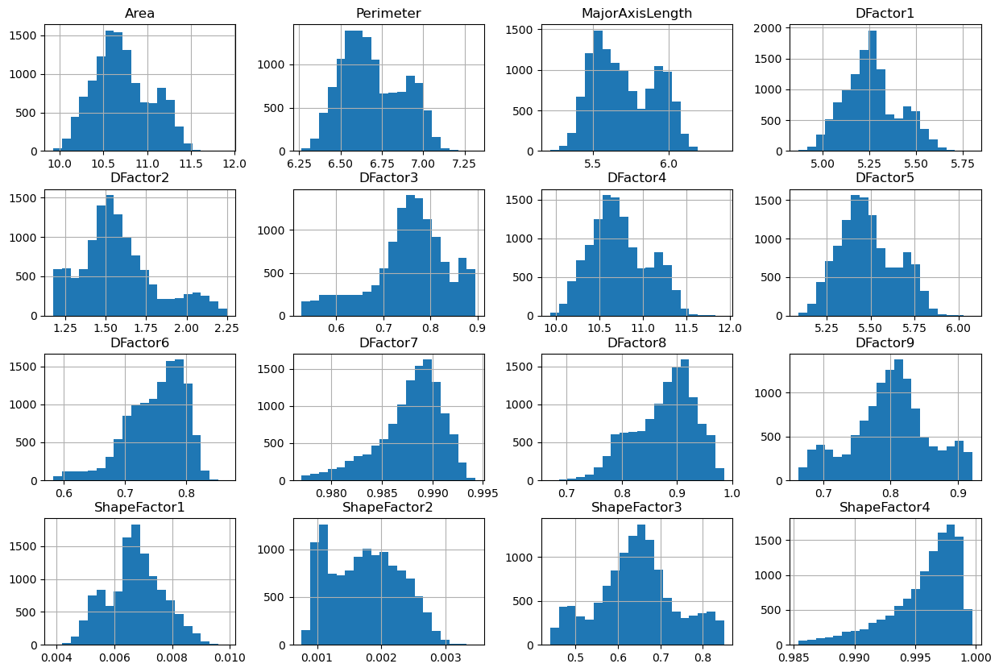

In [66]:
data.hist(bins=20, figsize=(15, 10))
plt.show()

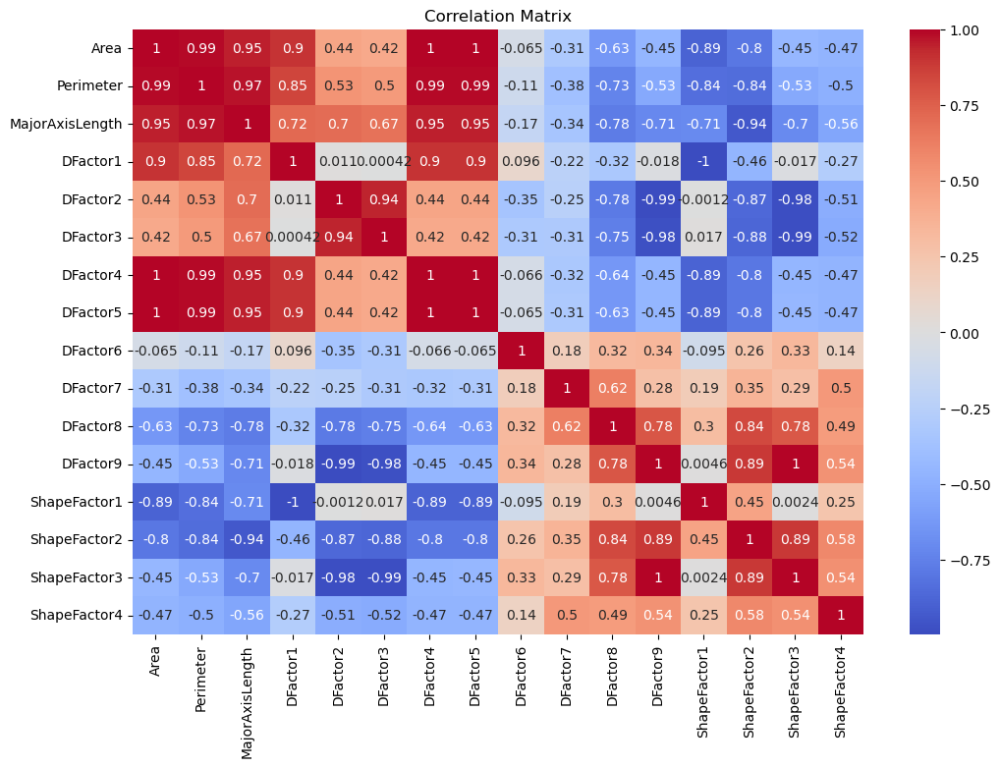

In [67]:
correlation_matrix = data.corr(numeric_only=True)
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

High correlation between two variables may indicate multicollinearity, which can affect the performance and interpretability of regression models.

In [68]:
correlation_matrix = data.corr(numeric_only=True)

# Identify highly correlated variables
highly_correlated_pairs = (correlation_matrix.abs() >= 0.95) & (correlation_matrix.abs() <= 1.0)

# Create a set to store columns to be dropped
columns_to_drop = set()

# Iterate through the pairs and add one of the variables to the set
for col in correlation_matrix.columns:
    correlated_cols = highly_correlated_pairs[col][highly_correlated_pairs[col]].index.tolist()
    columns_to_drop.update(correlated_cols[1:])

# Drop the identified columns
data = data.drop(columns=columns_to_drop)


Feature selection is done in the code above

In [69]:
print(data)

            Area  DFactor1  DFactor2  DFactor6  DFactor7  DFactor8  \
0      10.254004  5.164150  1.197191  0.763923  0.988856  0.958027   
2      10.288103  5.175761  1.209713  0.778113  0.989559  0.947849   
9      10.336406  5.203443  1.200834  0.783683  0.990810  0.970278   
13     10.346858  5.218431  1.178827  0.798759  0.989394  0.948119   
19     10.352523  5.221239  1.177161  0.774277  0.991645  0.976511   
...          ...       ...       ...       ...       ...       ...   
13606  10.647756  5.230813  1.552728  0.714574  0.990331  0.916603   
13607  10.647851  5.256000  1.476439  0.799943  0.990752  0.922015   
13608  10.648753  5.258474  1.472582  0.729932  0.989899  0.918424   
13609  10.648943  5.253716  1.489326  0.705389  0.987813  0.907906   
13610  10.649227  5.210604  1.619841  0.788962  0.989648  0.888380   

       ShapeFactor2  ShapeFactor4 Class  
0          0.003147      0.998724    SE  
2          0.003048      0.999066    SE  
9          0.003008      0.999061

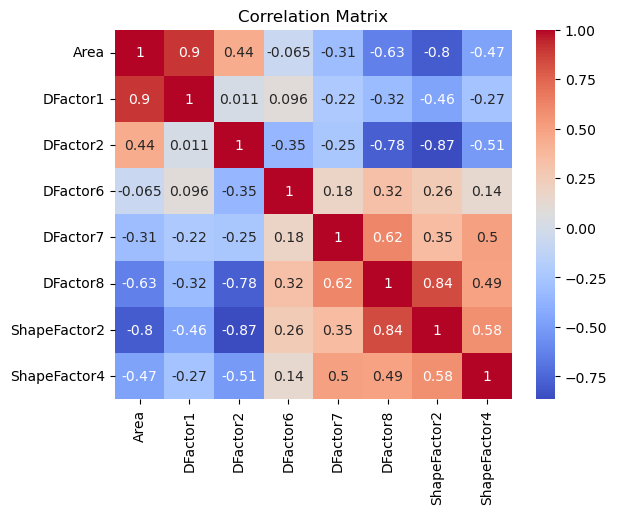

In [70]:
correlation_matrix = data.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [142]:
import plotly.express as px

fig = px.scatter(data, x='Area', y='DFactor6', color='Class')
fig.show()


In [17]:
import plotly.express as px

fig = px.scatter(data, x='Area', y='DFactor7', color='Class')
fig.show()


In [18]:
import plotly.express as px

fig = px.scatter(data, x='Area', y='ShapeFactor4', color='Class')
fig.show()

In [19]:
import plotly.express as px

fig = px.scatter(data, x='DFactor7', y='DFactor6', color='Class')
fig.show()

In [20]:
import plotly.express as px

fig = px.scatter(data, x='DFactor6', y='ShapeFactor4', color='Class')
fig.show()

###### From the above scatter plots,its clear that categories - DE, SI, HO and CA can be easyly distinguished using area.

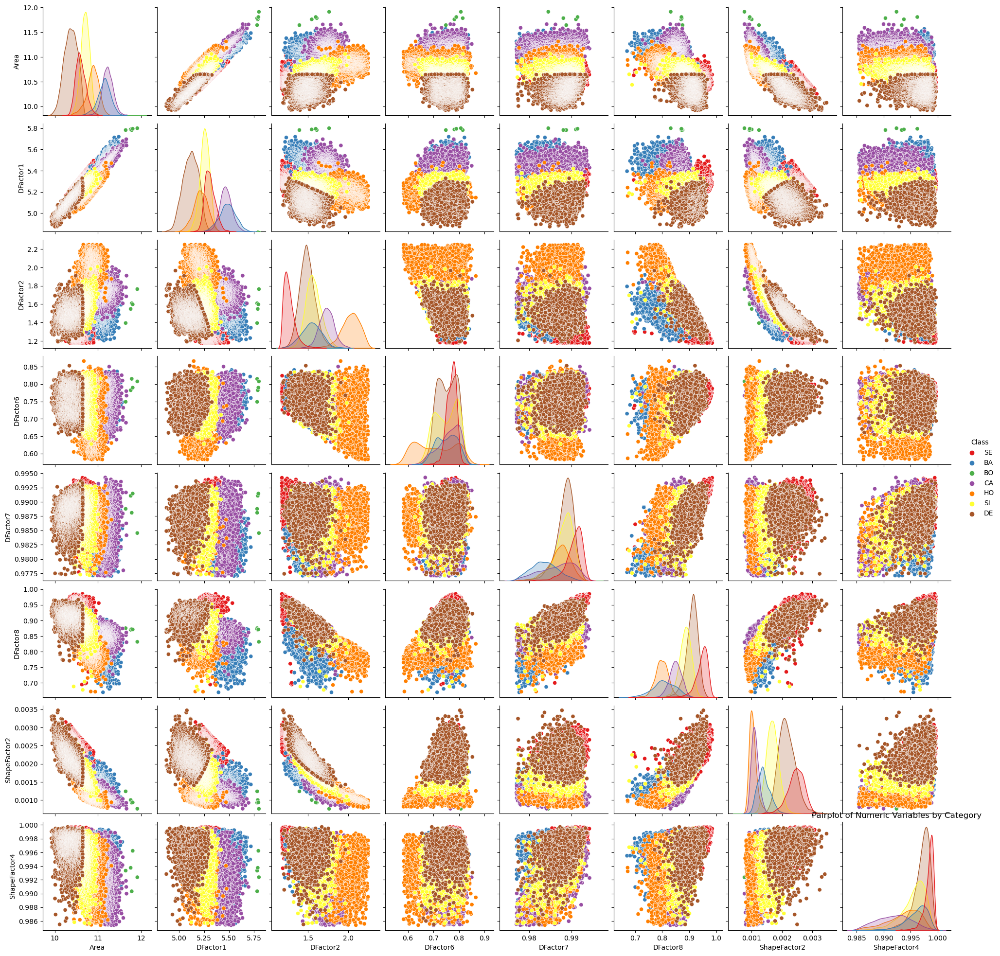

In [21]:
sns.pairplot(data, hue='Class', palette='Set1')
plt.title('Pairplot of Numeric Variables by Category')
plt.show()

# Classification Models:

In [74]:
#Importing the dataset
X = data.iloc[:, :-1].values
y = data.iloc[:, -1].values

### 1. Logistic Regression:

In [109]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [110]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In scikit-learn's Logistic Regression implementation, the multi_class parameter is used to specify the strategy to handle multiple classes in a classification problem. Logistic Regression in scikit-learn supports several strategies for handling multiclass problems, and the multi_class parameter controls the choice of strategy.

'ovr' (One-vs-Rest): This is the default strategy. In this approach, a binary logistic regression model is trained for each class against all other classes. This results in as many binary classifiers as there are classes. During prediction, the class with the highest probability is chosen.

In [111]:
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression(multi_class='ovr', random_state = 0)
classifier.fit(X_train, y_train)

LogisticRegression(multi_class='ovr', random_state=0)

In [112]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy =accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

[[266   0  19   0   3   0   9]
 [  0   0   1   0   0   0   0]
 [  5   0 318   0   5   1  15]
 [  0   0   0 804   0  13  54]
 [  1   0  10   5 346   0  10]
 [  5   0   0   9   0 374  18]
 [  7   0   2  71   9   4 602]]
Accuracy: 90.76%


In [113]:
y_train_pred = classifier.predict(X_train)

# Evaluate accuracy on the training set
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f'Training Accuracy: {train_accuracy:.2f}')

# Evaluate accuracy on the test set
test_accuracy = accuracy_score(y_test, y_pred)
print(f'Test Accuracy: {test_accuracy:.2f}')

if train_accuracy > test_accuracy:
    print('Warning: The model may be overfitting to the training data.')
else:
    print('The model seems to generalize well to unseen data.')

Training Accuracy: 0.91
Test Accuracy: 0.91


### 2. Decision Tree Classification:

In [103]:
#Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [104]:
#Feature Scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

Decision trees using the "entropy criterion" tend to prioritize making splits that lead to more balanced and homogenous child nodes in terms of class labels.

In [105]:
from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier(criterion = 'entropy', random_state = 0)
classifier.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=0)

In [106]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy =accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

[[260   0  23   0   5   1   8]
 [  0   1   0   0   0   0   0]
 [ 15   0 318   0   5   1   5]
 [  1   0   0 790   5  12  63]
 [  4   0  11   3 342   0  12]
 [  6   0   1  16   0 366  17]
 [  8   0   1  69  18  19 580]]
Accuracy: 88.98%


Hyperparameter Tuning:

In [107]:
# Example of hyperparameter tuning using GridSearchCV
from sklearn.model_selection import GridSearchCV

param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(classifier, param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_
print('Best Hyperparameters:', best_params)

# Use the best model for predictions
best_tree_classifier = grid_search.best_estimator_
y_pred_best = best_tree_classifier.predict(X_test)

C:\Users\user\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:725: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=5.



Best Hyperparameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 5}


In [33]:
from sklearn.metrics import confusion_matrix, accuracy_score
cm = confusion_matrix(y_test, y_pred_best)
print(cm)
accuracy =accuracy_score(y_test, y_pred_best)
print(f"Accuracy: {accuracy * 100:.2f}%")

[[260   0  26   0   2   2   7]
 [  0   1   0   0   0   0   0]
 [ 16   0 317   0   6   1   4]
 [  0   0   0 800   2  10  59]
 [  4   0  12   6 337   0  13]
 [  1   0   1  17   0 370  17]
 [  2   0   4  75   5   8 601]]
Accuracy: 89.95%


In [108]:
#OverFit Test


y_train_pred = classifier.predict(X_train)

# Evaluate accuracy on the training set
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f'Training Accuracy: {train_accuracy:.2f}')

# Evaluate accuracy on the test set
test_accuracy = accuracy_score(y_test, y_pred_best)
print(f'Test Accuracy: {test_accuracy:.2f}')

if train_accuracy > test_accuracy:
    print('Warning: The model may be overfitting to the training data.')
else:
    print('The model seems to generalize well to unseen data.')

Training Accuracy: 1.00
Test Accuracy: 0.90


The accuracy is increased!

### 3. K Nearest Neighbors:

In [96]:
#Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

The scale of these features are different and KNN is highly sensitive to scaling. Thus, we need to do standardization before training the model.

In [97]:
#Feature Scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [98]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 2)
classifier.fit(X_train, y_train)

KNeighborsClassifier()

In [99]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy =accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

[[271   0  20   0   0   1   5]
 [  0   0   1   0   0   0   0]
 [ 12   0 325   0   2   1   4]
 [  0   0   0 808   0  13  50]
 [  2   0  11   5 341   0  13]
 [  1   0   0  20   0 375  10]
 [  3   0   4  67   6   5 610]]
Accuracy: 91.43%


In [100]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

# Define the hyperparameter grid
param_grid = {'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17, 19]}

# Create the KNN classifier
knn = KNeighborsClassifier()

# Instantiate the GridSearchCV object
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best hyperparameter values
best_params = grid_search.best_params_

print(best_params)

C:\Users\user\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:725: UserWarning:

The least populated class in y has only 4 members, which is less than n_splits=5.



{'n_neighbors': 13}


In [101]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors = 13, metric = 'minkowski', p = 2)
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
accuracy =accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 92.23%


In [102]:
#OverFit Test


y_train_pred = classifier.predict(X_train)

# Evaluate accuracy on the training set
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f'Training Accuracy: {train_accuracy:.2f}')

# Evaluate accuracy on the test set
test_accuracy = accuracy_score(y_test, y_pred)
print(f'Test Accuracy: {test_accuracy:.2f}')

if train_accuracy > test_accuracy:
    print('Warning: The model may be overfitting to the training data.')
else:
    print('The model seems to generalize well to unseen data.')

Training Accuracy: 0.93
Test Accuracy: 0.92


### 4. Random Forest Classification 

In [91]:
#Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [92]:
#Feature Scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [93]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)
classifier.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)

In [94]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy =accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

[[276   0  15   0   0   1   5]
 [  0   0   1   0   0   0   0]
 [ 18   0 317   0   4   1   4]
 [  0   0   0 818   0  11  42]
 [  4   0  13   5 340   0  10]
 [  2   0   1  14   0 379  10]
 [  4   0   2  80   8  11 590]]
Accuracy: 91.09%


In [95]:
#OverFit Test


y_train_pred = classifier.predict(X_train)

# Evaluate accuracy on the training set
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f'Training Accuracy: {train_accuracy:.2f}')

# Evaluate accuracy on the test set
test_accuracy = accuracy_score(y_test, y_pred)
print(f'Test Accuracy: {test_accuracy:.2f}')

if train_accuracy > test_accuracy:
    print('Warning: The model may be overfitting to the training data.')
else:
    print('The model seems to generalize well to unseen data.')

Training Accuracy: 1.00
Test Accuracy: 0.91


### 5. Support Vector Machine - Kernal: Linear

In [81]:
#Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [82]:
#Feature Scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [83]:
from sklearn.svm import SVC
classifier = SVC(kernel = 'linear', random_state = 0)
classifier.fit(X_train, y_train)

SVC(kernel='linear', random_state=0)

In [84]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy =accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

[[272   0  21   0   0   1   3]
 [  0   1   0   0   0   0   0]
 [ 10   0 323   0   6   1   4]
 [  0   0   0 817   0  10  44]
 [  1   0  12   5 343   0  11]
 [  3   0   0   9   0 380  14]
 [  3   0   1  60   7   5 619]]
Accuracy: 92.26%


In [85]:
#OverFit Test


y_train_pred = classifier.predict(X_train)

# Evaluate accuracy on the training set
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f'Training Accuracy: {train_accuracy:.2f}')

# Make predictions on the test set
y_test_pred = classifier.predict(X_test)

# Evaluate accuracy on the test set
test_accuracy = accuracy_score(y_test, y_pred)
print(f'Test Accuracy: {test_accuracy:.2f}')

if train_accuracy > test_accuracy:
    print('Warning: The model may be overfitting to the training data.')
else:
    print('The model seems to generalize well to unseen data.')

Training Accuracy: 0.92
Test Accuracy: 0.92


### 6. Support Vector Machine - Kernal: RBF

In [114]:
#Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [115]:
#Feature Scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In kernelized methods, such as Support Vector Machines (SVM) or kernelized regression, the kernel functions often involve quadratic terms. Radial Basis Function (RBF) kernels, for instance, have a Gaussian shape that can resemble a parabola.

In [116]:
from sklearn.svm import SVC
classifier = SVC(kernel = 'rbf', random_state = 0)
classifier.fit(X_train, y_train)

SVC(random_state=0)

In [117]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy =accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

[[274   0  16   0   1   1   5]
 [  0   0   1   0   0   0   0]
 [  6   0 329   0   3   1   5]
 [  0   0   0 820   0  10  41]
 [  1   0  10   4 348   0   9]
 [  2   0   0   9   0 384  11]
 [  2   0   1  57   7   6 622]]
Accuracy: 93.00%


Overfit Test:

In [118]:
y_train_pred = classifier.predict(X_train)

# Evaluate accuracy on the training set
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f'Training Accuracy: {train_accuracy:.2f}')

# Evaluate accuracy on the test set
test_accuracy = accuracy_score(y_test, y_pred)
print(f'Test Accuracy: {test_accuracy:.2f}')

if train_accuracy > test_accuracy:
    print('Warning: The model may be overfitting to the training data.')
else:
    print('The model seems to generalize well to unseen data.')

Training Accuracy: 0.93
Test Accuracy: 0.93
The model seems to generalize well to unseen data.


### 7. Support Vector Machine - Kernal: poly

In [120]:
#Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [121]:
#Feature Scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [122]:
from sklearn.svm import SVC
classifier = SVC(kernel = 'poly', random_state = 0)
classifier.fit(X_train, y_train)

SVC(kernel='poly', random_state=0)

In [124]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy =accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

[[269   0  16   0   0   1  11]
 [  0   1   0   0   0   0   0]
 [  8   0 326   0   5   1   4]
 [  0   0   0 770   0   6  95]
 [  2   0  10   3 344   0  13]
 [  2   0   0  13   0 374  17]
 [  1   0   0  23   5   1 665]]
Accuracy: 92.06%


In [125]:
y_train_pred = classifier.predict(X_train)

# Evaluate accuracy on the training set
train_accuracy = accuracy_score(y_train, y_train_pred)
print(f'Training Accuracy: {train_accuracy:.2f}')

# Evaluate accuracy on the test set
test_accuracy = accuracy_score(y_test, y_pred)
print(f'Test Accuracy: {test_accuracy:.2f}')

if train_accuracy > test_accuracy:
    print('Warning: The model may be overfitting to the training data.')
else:
    print('The model seems to generalize well to unseen data.')

Training Accuracy: 0.92
Test Accuracy: 0.92
The model seems to generalize well to unseen data.


### 8. Naive Bayes

In [126]:
#Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [127]:
#Feature Scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [128]:
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(X_train, y_train)

GaussianNB()

In [129]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy =accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

[[257   0  30   0   3   0   7]
 [  0   1   0   0   0   0   0]
 [ 14   0 320   0   5   1   4]
 [  0   0   0 778   0  22  71]
 [  1   0  12   3 346   0  10]
 [  4   0   0   6   0 382  14]
 [  3   0   4  52  14   6 616]]
Accuracy: 90.42%


### 9. Gradient Boosting( XBoost )

In [130]:
#Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [131]:
#Feature Scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

XGBoost expects numerical class labels (typically starting from 0), but it seems that our target variable has string labels ('BA', 'CA', 'DE', 'HO', 'SE', 'SI').

To resolve this issue, we can encode your categorical labels into numerical format using techniques such as Label Encoding.

In [132]:
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder
# Create a label encoder
label_encoder = LabelEncoder()

# Fit and transform the target variable in your training set
y_train_encoded = label_encoder.fit_transform(y_train)

xgb_classifier = xgb.XGBClassifier()
xgb_classifier.fit(X_train, y_train_encoded)
xgb_predictions = xgb_classifier.predict(X_test)

In [133]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy =accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

[[257   0  30   0   3   0   7]
 [  0   1   0   0   0   0   0]
 [ 14   0 320   0   5   1   4]
 [  0   0   0 778   0  22  71]
 [  1   0  12   3 346   0  10]
 [  4   0   0   6   0 382  14]
 [  3   0   4  52  14   6 616]]
Accuracy: 90.42%


### 10. Gradient Boosting( LightGBM )

In [134]:
#Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [135]:
#Feature Scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [136]:
import lightgbm as lgb
lgb_classifier = lgb.LGBMClassifier()
lgb_classifier.fit(X_train, y_train)
lgb_predictions = lgb_classifier.predict(X_test)

In [137]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred = classifier.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(cm)
accuracy =accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

[[257   0  30   0   3   0   7]
 [  0   1   0   0   0   0   0]
 [ 14   0 320   0   5   1   4]
 [  0   0   0 778   0  22  71]
 [  1   0  12   3 346   0  10]
 [  4   0   0   6   0 382  14]
 [  3   0   4  52  14   6 616]]
Accuracy: 90.42%


### 11. Gradient Boosting( CatBoost )

In [138]:
#Splitting the dataset into the Training set and Test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [139]:
#Feature Scaling 
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [140]:
import catboost
cat_classifier = catboost.CatBoostClassifier()
cat_classifier.fit(X_train, y_train)
cat_predictions = cat_classifier.predict(X_test)

Learning rate set to 0.088488
0:	learn: 1.5869786	total: 166ms	remaining: 2m 45s
1:	learn: 1.3630042	total: 189ms	remaining: 1m 34s
2:	learn: 1.2092502	total: 216ms	remaining: 1m 11s
3:	learn: 1.0848785	total: 251ms	remaining: 1m 2s
4:	learn: 0.9871976	total: 270ms	remaining: 53.7s
5:	learn: 0.8988009	total: 289ms	remaining: 47.8s
6:	learn: 0.8270209	total: 310ms	remaining: 43.9s
7:	learn: 0.7664907	total: 327ms	remaining: 40.5s
8:	learn: 0.7150121	total: 345ms	remaining: 38s
9:	learn: 0.6707650	total: 365ms	remaining: 36.1s
10:	learn: 0.6311705	total: 390ms	remaining: 35.1s
11:	learn: 0.5962373	total: 409ms	remaining: 33.7s
12:	learn: 0.5636530	total: 427ms	remaining: 32.4s
13:	learn: 0.5344439	total: 447ms	remaining: 31.5s
14:	learn: 0.5063251	total: 473ms	remaining: 31s
15:	learn: 0.4826824	total: 491ms	remaining: 30.2s
16:	learn: 0.4614955	total: 510ms	remaining: 29.5s
17:	learn: 0.4428850	total: 528ms	remaining: 28.8s
18:	learn: 0.4253755	total: 547ms	remaining: 28.2s
19:	learn: 0

160:	learn: 0.1719772	total: 3.87s	remaining: 20.2s
161:	learn: 0.1717142	total: 3.9s	remaining: 20.2s
162:	learn: 0.1715808	total: 3.92s	remaining: 20.1s
163:	learn: 0.1713238	total: 3.94s	remaining: 20.1s
164:	learn: 0.1710625	total: 3.95s	remaining: 20s
165:	learn: 0.1708534	total: 3.97s	remaining: 20s
166:	learn: 0.1704250	total: 3.99s	remaining: 19.9s
167:	learn: 0.1702508	total: 4.01s	remaining: 19.9s
168:	learn: 0.1699271	total: 4.03s	remaining: 19.8s
169:	learn: 0.1696345	total: 4.05s	remaining: 19.8s
170:	learn: 0.1693899	total: 4.07s	remaining: 19.7s
171:	learn: 0.1691891	total: 4.09s	remaining: 19.7s
172:	learn: 0.1689907	total: 4.11s	remaining: 19.7s
173:	learn: 0.1687172	total: 4.13s	remaining: 19.6s
174:	learn: 0.1685355	total: 4.15s	remaining: 19.6s
175:	learn: 0.1682821	total: 4.18s	remaining: 19.6s
176:	learn: 0.1678887	total: 4.21s	remaining: 19.6s
177:	learn: 0.1676267	total: 4.23s	remaining: 19.5s
178:	learn: 0.1672797	total: 4.26s	remaining: 19.5s
179:	learn: 0.167

320:	learn: 0.1404240	total: 7.29s	remaining: 15.4s
321:	learn: 0.1401253	total: 7.31s	remaining: 15.4s
322:	learn: 0.1399737	total: 7.33s	remaining: 15.4s
323:	learn: 0.1397004	total: 7.35s	remaining: 15.3s
324:	learn: 0.1396609	total: 7.37s	remaining: 15.3s
325:	learn: 0.1395170	total: 7.39s	remaining: 15.3s
326:	learn: 0.1394295	total: 7.4s	remaining: 15.2s
327:	learn: 0.1391917	total: 7.43s	remaining: 15.2s
328:	learn: 0.1390304	total: 7.45s	remaining: 15.2s
329:	learn: 0.1389418	total: 7.47s	remaining: 15.2s
330:	learn: 0.1386635	total: 7.49s	remaining: 15.1s
331:	learn: 0.1385504	total: 7.51s	remaining: 15.1s
332:	learn: 0.1384115	total: 7.54s	remaining: 15.1s
333:	learn: 0.1382491	total: 7.56s	remaining: 15.1s
334:	learn: 0.1380367	total: 7.59s	remaining: 15.1s
335:	learn: 0.1378251	total: 7.61s	remaining: 15s
336:	learn: 0.1376792	total: 7.63s	remaining: 15s
337:	learn: 0.1374063	total: 7.65s	remaining: 15s
338:	learn: 0.1371469	total: 7.67s	remaining: 15s
339:	learn: 0.1370868

483:	learn: 0.1177256	total: 11.1s	remaining: 11.8s
484:	learn: 0.1176246	total: 11.1s	remaining: 11.8s
485:	learn: 0.1175475	total: 11.1s	remaining: 11.8s
486:	learn: 0.1173904	total: 11.2s	remaining: 11.7s
487:	learn: 0.1172020	total: 11.2s	remaining: 11.7s
488:	learn: 0.1170501	total: 11.2s	remaining: 11.7s
489:	learn: 0.1169958	total: 11.2s	remaining: 11.7s
490:	learn: 0.1168668	total: 11.2s	remaining: 11.7s
491:	learn: 0.1167231	total: 11.3s	remaining: 11.6s
492:	learn: 0.1165493	total: 11.3s	remaining: 11.6s
493:	learn: 0.1164442	total: 11.3s	remaining: 11.6s
494:	learn: 0.1163652	total: 11.3s	remaining: 11.6s
495:	learn: 0.1162855	total: 11.4s	remaining: 11.6s
496:	learn: 0.1162120	total: 11.4s	remaining: 11.5s
497:	learn: 0.1160864	total: 11.4s	remaining: 11.5s
498:	learn: 0.1159165	total: 11.5s	remaining: 11.5s
499:	learn: 0.1157817	total: 11.5s	remaining: 11.5s
500:	learn: 0.1155963	total: 11.5s	remaining: 11.5s
501:	learn: 0.1153972	total: 11.6s	remaining: 11.5s
502:	learn: 

644:	learn: 0.1003659	total: 15.4s	remaining: 8.45s
645:	learn: 0.1003094	total: 15.4s	remaining: 8.43s
646:	learn: 0.1001682	total: 15.4s	remaining: 8.41s
647:	learn: 0.0999762	total: 15.5s	remaining: 8.39s
648:	learn: 0.0999415	total: 15.5s	remaining: 8.37s
649:	learn: 0.0998427	total: 15.5s	remaining: 8.35s
650:	learn: 0.0997334	total: 15.5s	remaining: 8.32s
651:	learn: 0.0996406	total: 15.5s	remaining: 8.3s
652:	learn: 0.0995167	total: 15.6s	remaining: 8.27s
653:	learn: 0.0994232	total: 15.6s	remaining: 8.25s
654:	learn: 0.0993767	total: 15.6s	remaining: 8.23s
655:	learn: 0.0992916	total: 15.7s	remaining: 8.21s
656:	learn: 0.0991644	total: 15.7s	remaining: 8.18s
657:	learn: 0.0990961	total: 15.7s	remaining: 8.16s
658:	learn: 0.0989031	total: 15.7s	remaining: 8.14s
659:	learn: 0.0988216	total: 15.8s	remaining: 8.12s
660:	learn: 0.0987022	total: 15.8s	remaining: 8.1s
661:	learn: 0.0986214	total: 15.8s	remaining: 8.07s
662:	learn: 0.0985644	total: 15.8s	remaining: 8.05s
663:	learn: 0.

804:	learn: 0.0864460	total: 19.6s	remaining: 4.74s
805:	learn: 0.0863738	total: 19.6s	remaining: 4.72s
806:	learn: 0.0862862	total: 19.6s	remaining: 4.69s
807:	learn: 0.0862659	total: 19.6s	remaining: 4.67s
808:	learn: 0.0861853	total: 19.7s	remaining: 4.64s
809:	learn: 0.0861399	total: 19.7s	remaining: 4.61s
810:	learn: 0.0861157	total: 19.7s	remaining: 4.59s
811:	learn: 0.0860611	total: 19.7s	remaining: 4.56s
812:	learn: 0.0860019	total: 19.7s	remaining: 4.54s
813:	learn: 0.0858991	total: 19.8s	remaining: 4.51s
814:	learn: 0.0858016	total: 19.8s	remaining: 4.49s
815:	learn: 0.0857134	total: 19.8s	remaining: 4.46s
816:	learn: 0.0856499	total: 19.8s	remaining: 4.44s
817:	learn: 0.0855721	total: 19.8s	remaining: 4.42s
818:	learn: 0.0855042	total: 19.9s	remaining: 4.39s
819:	learn: 0.0854405	total: 19.9s	remaining: 4.37s
820:	learn: 0.0853293	total: 19.9s	remaining: 4.34s
821:	learn: 0.0852780	total: 19.9s	remaining: 4.32s
822:	learn: 0.0851739	total: 20s	remaining: 4.29s
823:	learn: 0.

967:	learn: 0.0752098	total: 23.1s	remaining: 763ms
968:	learn: 0.0751946	total: 23.1s	remaining: 739ms
969:	learn: 0.0751216	total: 23.1s	remaining: 716ms
970:	learn: 0.0750492	total: 23.2s	remaining: 692ms
971:	learn: 0.0749713	total: 23.2s	remaining: 668ms
972:	learn: 0.0749449	total: 23.2s	remaining: 644ms
973:	learn: 0.0748732	total: 23.2s	remaining: 620ms
974:	learn: 0.0748417	total: 23.3s	remaining: 597ms
975:	learn: 0.0747956	total: 23.3s	remaining: 573ms
976:	learn: 0.0747473	total: 23.3s	remaining: 549ms
977:	learn: 0.0747208	total: 23.3s	remaining: 525ms
978:	learn: 0.0746820	total: 23.4s	remaining: 501ms
979:	learn: 0.0746088	total: 23.4s	remaining: 477ms
980:	learn: 0.0745089	total: 23.4s	remaining: 453ms
981:	learn: 0.0744569	total: 23.4s	remaining: 429ms
982:	learn: 0.0744200	total: 23.5s	remaining: 406ms
983:	learn: 0.0743600	total: 23.5s	remaining: 382ms
984:	learn: 0.0742752	total: 23.5s	remaining: 358ms
985:	learn: 0.0742203	total: 23.5s	remaining: 334ms
986:	learn: 

# Model Comparison 

#### Note For the Code Below: Classification Models Without Feature Scaling  
By setting zero_division='warn', you will still see the warnings but they won't result in exceptions being raised. If you want to suppress the warnings altogether, you can set zero_division=1 or any other numeric value that makes sense for your context.

In [141]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

#Importing the dataset
X = data.iloc[:, :-1].values
y = data.iloc[:, -1].values

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

# Logistic Regression
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
logreg_predictions = logreg.predict(X_test)

# Decision Trees
dtree = DecisionTreeClassifier()
dtree.fit(X_train, y_train)
dtree_predictions = dtree.predict(X_test)

# Random Forest
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
rf_predictions = rf.predict(X_test)

# Support Vector Machines (SVM)
svm = SVC()
svm.fit(X_train, y_train)
svm_predictions = svm.predict(X_test)

# Evaluation
def evaluate_model(predictions, model_name):
    print(f"### {model_name} ###")
    report = classification_report(y_test, predictions, zero_division= 1)
    print("Accuracy:", accuracy_score(y_test, predictions))
    print("Confusion Matrix:\n", confusion_matrix(y_test, predictions))
    print("Classification Report:\n", classification_report(y_test, predictions))
    print("\n")

evaluate_model(logreg_predictions, "Logistic Regression")
evaluate_model(dtree_predictions, "Decision Trees")
evaluate_model(rf_predictions, "Random Forest")
evaluate_model(svm_predictions, "Support Vector Machines (SVM)")


C:\Users\user\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



### Logistic Regression ###
Accuracy: 0.8680509042196919
Confusion Matrix:
 [[215   0  53   0   0  14  15]
 [  1   0   0   0   0   0   0]
 [ 23   0 296   0   6   1  18]
 [  0   0   0 838   1  13  19]
 [  0   0  22   4 338   0   8]
 [  1   0   0  20   0 373  12]
 [  1   0  17 132   8   5 532]]


C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Classification Report:
               precision    recall  f1-score   support

          BA       0.89      0.72      0.80       297
          BO       0.00      0.00      0.00         1
          CA       0.76      0.86      0.81       344
          DE       0.84      0.96      0.90       871
          HO       0.96      0.91      0.93       372
          SE       0.92      0.92      0.92       406
          SI       0.88      0.77      0.82       695

    accuracy                           0.87      2986
   macro avg       0.75      0.73      0.74      2986
weighted avg       0.87      0.87      0.87      2986



### Decision Trees ###
Accuracy: 0.8945077026121903
Confusion Matrix:
 [[264   0  23   0   2   3   5]
 [  0   0   1   0   0   0   0]
 [ 18   0 316   0   6   1   3]
 [  0   0   0 785   4  11  71]
 [  3   0  10   5 343   0  11]
 [  5   0   1  17   0 367  16]
 [  5   0   5  66  11  12 596]]


C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Classification Report:
               precision    recall  f1-score   support

          BA       0.89      0.89      0.89       297
          BO       0.00      0.00      0.00         1
          CA       0.89      0.92      0.90       344
          DE       0.90      0.90      0.90       871
          HO       0.94      0.92      0.93       372
          SE       0.93      0.90      0.92       406
          SI       0.85      0.86      0.85       695

    accuracy                           0.89      2986
   macro avg       0.77      0.77      0.77      2986
weighted avg       0.89      0.89      0.89      2986



### Random Forest ###
Accuracy: 0.919959812458138
Confusion Matrix:
 [[271   0  19   0   0   1   6]
 [  0   0   1   0   0   0   0]
 [  9   0 325   0   4   1   5]
 [  0   0   0 813   0  11  47]
 [  3   0  12   5 341   0  11]
 [  1   0   0  16   0 379  10]
 [  3   0   2  60   5   7 618]]


C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Classification Report:
               precision    recall  f1-score   support

          BA       0.94      0.91      0.93       297
          BO       0.00      0.00      0.00         1
          CA       0.91      0.94      0.92       344
          DE       0.91      0.93      0.92       871
          HO       0.97      0.92      0.94       372
          SE       0.95      0.93      0.94       406
          SI       0.89      0.89      0.89       695

    accuracy                           0.92      2986
   macro avg       0.80      0.79      0.79      2986
weighted avg       0.92      0.92      0.92      2986



### Support Vector Machines (SVM) ###
Accuracy: 0.8623576691225721
Confusion Matrix:
 [[137   0 132   0   0   2  26]
 [  0   0   1   0   0   0   0]
 [ 10   0 323   0   3   1   7]
 [  0   0   0 790   0  11  70]
 [  0   0  16   6 332   0  18]
 [  1   0   0  10   0 371  24]
 [  0   0   1  64   3   5 622]]
Classification Report:
               precision    recall  f1-score   sup

C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\user\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

